<a href="https://colab.research.google.com/github/MuhammadFaridMauludin/PCVK_Ganjil_2025/blob/main/Pertemuan_11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

object detection
1. template matching
2. edge detection
3. corner detection
4. grid detection
5. contour detection

In [ ]:
#import library yang dibutuhkan
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Gambar berhasil dimuat!
Ukuran gambar utama: (829, 1024, 3)
Ukuran template: (449, 356, 3)
----------------------------------------
Metode: TM_SQDIFF
  ➤ MinVal: -0.0000, MaxVal: 1.0000
  ➤ Lokasi hasil terbaik: (597, 305)
----------------------------------------


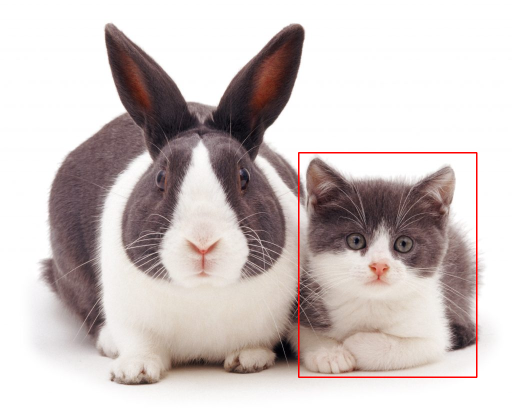

Metode: TM_SQDIFF_NORMED
  ➤ MinVal: 0.0000, MaxVal: 1.0000
  ➤ Lokasi hasil terbaik: (597, 305)
----------------------------------------


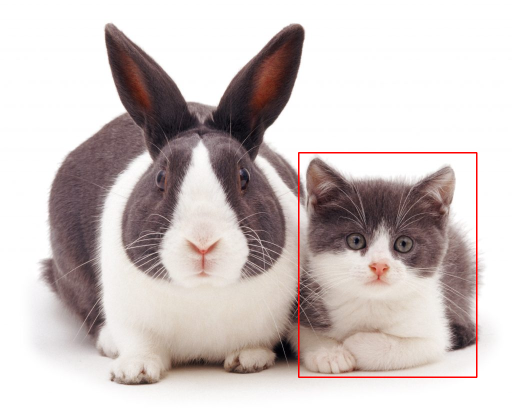

Metode: TM_CCORR
  ➤ MinVal: 0.0000, MaxVal: 1.0000
  ➤ Lokasi hasil terbaik: (668, 0)
----------------------------------------


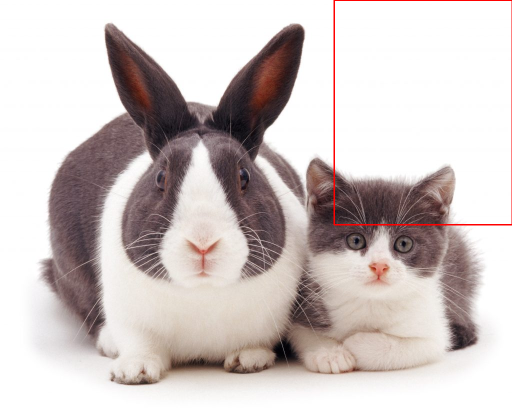

Metode: TM_CCORR_NORMED
  ➤ MinVal: -0.0000, MaxVal: 1.0000
  ➤ Lokasi hasil terbaik: (597, 305)
----------------------------------------


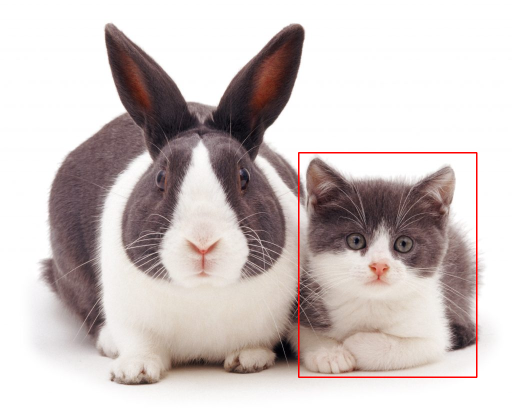

Metode: TM_CCOEFF
  ➤ MinVal: -0.0000, MaxVal: 1.0000
  ➤ Lokasi hasil terbaik: (597, 305)
----------------------------------------


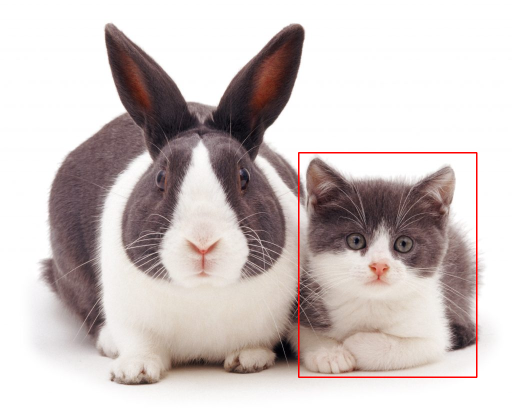

Metode: TM_CCOEFF_NORMED
  ➤ MinVal: 0.0000, MaxVal: 1.0000
  ➤ Lokasi hasil terbaik: (597, 305)
----------------------------------------


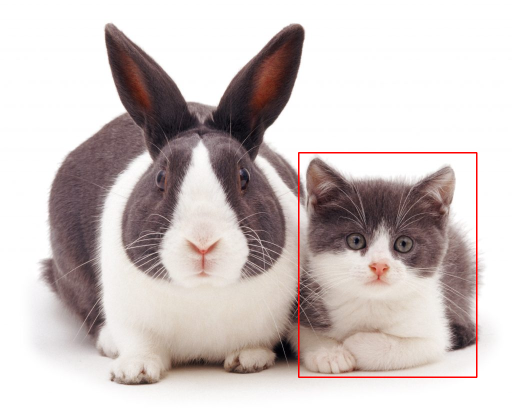

Selesai ✅


In [ ]:
from __future__ import print_function
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive

# --- Mount Google Drive ---
drive.mount('/content/drive')

# --- Inisialisasi variabel global ---
use_mask = False
img = None
templ = None
mask = None
match_method = 0
max_Trackbar = 5

def main():
    global img, templ, use_mask, mask

    # --- Ganti path sesuai gambar di Google Drive kamu ---
    img_path = "/content/drive/MyDrive/pcvk/jb 11/cats_and_bunnies.jpg"
    templ_path = "/content/drive/MyDrive/pcvk/jb 11/cat2_templatejpg.jpg"
    # mask_path = "/content/drive/MyDrive/pcvk/jb 11/mask.jpg"

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    templ = cv2.imread(templ_path, cv2.IMREAD_COLOR)
    # mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
    # use_mask = True  # aktifkan kalau ingin menggunakan mask

    if img is None or templ is None or (use_mask and mask is None):
        print("❌ Tidak bisa membaca gambar. Periksa kembali path-nya.")
        return -1

    print("✅ Gambar berhasil dimuat!")
    print("Ukuran gambar utama:", img.shape)
    print("Ukuran template:", templ.shape)
    print("-" * 40)

    # --- Jalankan semua 6 metode matching ---
    for method in range(6):
        MatchingMethod(method)

    print("Selesai ✅")
    return 0


def MatchingMethod(match_method):
    img_display = img.copy()

    # --- Tentukan apakah metode mendukung mask ---
    method_accepts_mask = (cv2.TM_SQDIFF == match_method or match_method == cv2.TM_CCORR_NORMED)

    # --- Jalankan template matching ---
    if use_mask and method_accepts_mask:
        result = cv2.matchTemplate(img, templ, match_method, None, mask)
    else:
        result = cv2.matchTemplate(img, templ, match_method)

    # --- Normalisasi hasil ---
    cv2.normalize(result, result, 0, 1, cv2.NORM_MINMAX, -1)

    # --- Cari posisi terbaik ---
    _minVal, _maxVal, minLoc, maxLoc = cv2.minMaxLoc(result, None)
    if match_method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        matchLoc = minLoc
    else:
        matchLoc = maxLoc

    # --- Gambar persegi di lokasi hasil pencocokan ---
    h, w = templ.shape[:2]
    cv2.rectangle(img_display, matchLoc, (matchLoc[0] + w, matchLoc[1] + h), (0, 0, 255), 2)

    # --- Cetak informasi hasil ---
    print(f"Metode: {method_name(match_method)}")
    print(f"  ➤ MinVal: {_minVal:.4f}, MaxVal: {_maxVal:.4f}")
    print(f"  ➤ Lokasi hasil terbaik: {matchLoc}")
    print("-" * 40)

    # --- Resize biar tampilan tidak terlalu besar ---
    scale = 0.5
    resized_img = cv2.resize(img_display, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    cv2_imshow(resized_img)


def method_name(method_id):
    """Fungsi bantu untuk menampilkan nama metode"""
    methods = [
        "TM_SQDIFF",
        "TM_SQDIFF_NORMED",
        "TM_CCORR",
        "TM_CCORR_NORMED",
        "TM_CCOEFF",
        "TM_CCOEFF_NORMED"
    ]
    return methods[method_id]


if __name__ == "__main__":
    main()


Metode: cv2.TM_CCOEFF


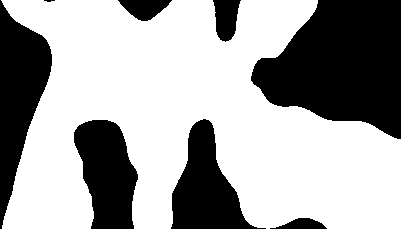

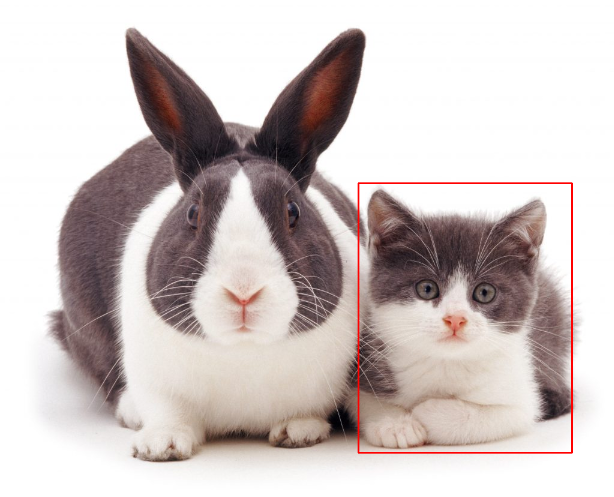

Metode: cv2.TM_CCOEFF_NORMED


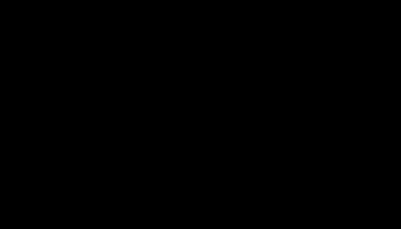

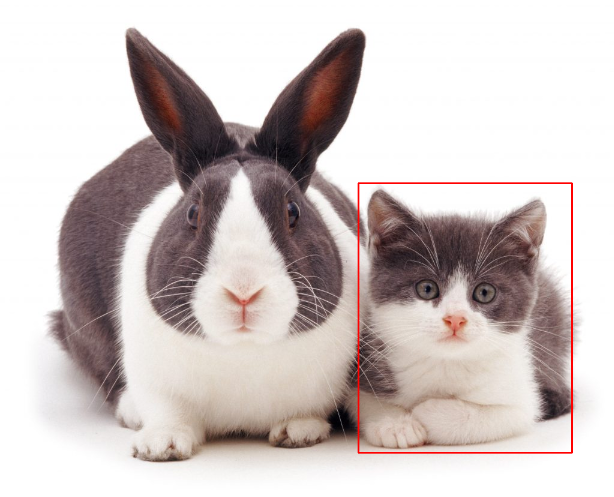

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Pastikan path sesuai hasil dari os.listdir()
img_path = '/content/drive/MyDrive/pcvk/jb 11/cats_and_bunnies.jpg'
template_path = '/content/drive/MyDrive/pcvk/jb 11/cat2_templatejpg.jpg'

img = cv2.imread(img_path)
template = cv2.imread(template_path, 0)

if img is None:
    print("❌ Gambar utama tidak ditemukan, periksa path:", img_path)
if template is None:
    print("❌ Template tidak ditemukan, periksa path:", template_path)

# Kalau dua-duanya kebaca, lanjut
if img is not None and template is not None:
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = template.shape[:2]

    methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED']

    for meth in methods:
        img2 = img.copy()
        method = eval(meth)
        result = cv2.matchTemplate(img_gray, template, method)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc

        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv2.rectangle(img2, top_left, bottom_right, (0, 0, 255), 2)

        print(f"Metode: {meth}")
        cv2_imshow(cv2.resize(result, (0,0), fx=0.6, fy=0.6))
        cv2_imshow(cv2.resize(img2, (0,0), fx=0.6, fy=0.6))


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('/content/drive/MyDrive/pcvk/jb 11/cats_and_bunnies.jpg')
template = cv.imread('/content/drive/MyDrive/pcvk/jb 11/cat2_template.jpg')

if img is None or template is None:
    print("❌ Pastikan path gambar dan template benar")
else:
    img2 = img.copy()

    # Ukuran template
    h, w = template.shape[:2]

    # Daftar metode matching
    methods = [
        'cv.TM_CCOEFF',
        'cv.TM_CCOEFF_NORMED',
        'cv.TM_CCORR',
        'cv.TM_CCORR_NORMED',
        'cv.TM_SQDIFF',
        'cv.TM_SQDIFF_NORMED'
    ]

    for meth in methods:
        img = img2.copy()
        method = eval(meth)

        # template matching
        res = cv.matchTemplate(img, template, method)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

        # Menentukan  titik dengan kecocokan tertinggi
        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc

        bottom_right = (top_left[0] + w, top_left[1] + h)

        # Gambar persegi pada area yang terdeteksi
        cv.rectangle(img, top_left, bottom_right, (0, 0, 255), 2)

        # Ubah BGR ke RGB agar tampil benar di matplotlib
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(8, 4))
        plt.subplot(121), plt.imshow(res, cmap='gray')
        plt.title('Matching Result'), plt.xticks([]), plt.yticks([])

        plt.subplot(122), plt.imshow(img_rgb)
        plt.title('Detected Point'), plt.xticks([]), plt.yticks([])

        plt.suptitle(meth)
        plt.show()


❌ Pastikan path gambar dan template benar


# Template maching

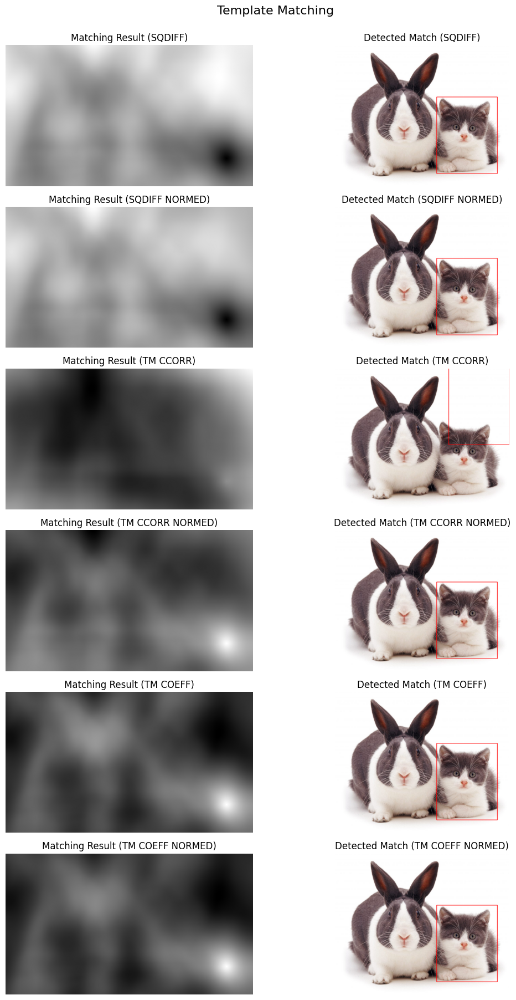

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

img_path = '/content/drive/MyDrive/pcvk/jb 11/cats_and_bunnies.jpg'
templ_path = '/content/drive/MyDrive/pcvk/jb 11/cat2_templatejpg.jpg'

img = cv.imread(img_path, cv.IMREAD_COLOR)
templ = cv.imread(templ_path, cv.IMREAD_COLOR)

if img is None or templ is None:
    print("Gagal membaca gambar atau template.")
else:
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    templ_rgb = cv.cvtColor(templ, cv.COLOR_BGR2RGB)

    # === Label metode seperti di trackbar ===
    trackbar_label = {
        0: 'SQDIFF',
        1: 'SQDIFF NORMED',
        2: 'TM CCORR',
        3: 'TM CCORR NORMED',
        4: 'TM COEFF',
        5: 'TM COEFF NORMED'
    }

    methods = [
        cv.TM_SQDIFF,
        cv.TM_SQDIFF_NORMED,
        cv.TM_CCORR,
        cv.TM_CCORR_NORMED,
        cv.TM_CCOEFF,
        cv.TM_CCOEFF_NORMED
    ]

    # === Figure: 6 baris (1 per metode), 2 kolom (heatmap kiri + hasil kanan) ===
    plt.figure(figsize=(12, 18))

    for i, method in enumerate(methods):
        result = cv.matchTemplate(img, templ, method)
        cv.normalize(result, result, 0, 1, cv.NORM_MINMAX, -1)

        _minVal, _maxVal, minLoc, maxLoc = cv.minMaxLoc(result, None)

        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            matchLoc = minLoc
        else:
            matchLoc = maxLoc

        # Gambar kotak hasil pada salinan gambar
        display = img_rgb.copy()
        top_left = matchLoc
        bottom_right = (top_left[0] + templ.shape[1], top_left[1] + templ.shape[0])
        cv.rectangle(display, top_left, bottom_right, (255, 0, 0), 2)

        # === Kolom kiri: peta hasil (matching result) ===
        plt.subplot(len(methods), 2, 2*i + 1)
        plt.imshow(result, cmap='gray')
        plt.title(f"Matching Result ({trackbar_label[i]})")
        plt.axis('off')

        # === Kolom kanan: hasil pencocokan di gambar asli ===
        plt.subplot(len(methods), 2, 2*i + 2)
        plt.imshow(display)
        plt.title(f"Detected Match ({trackbar_label[i]})")
        plt.axis('off')

    plt.suptitle("Template Matching", fontsize=16, y=1)
    plt.tight_layout()
    plt.show()


# template maching tanpa open cv

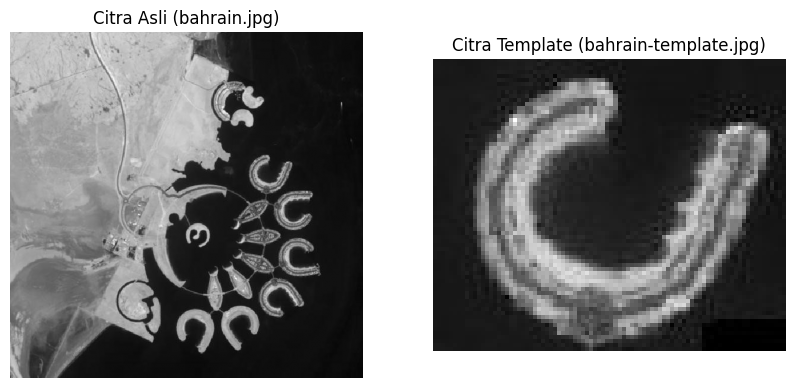

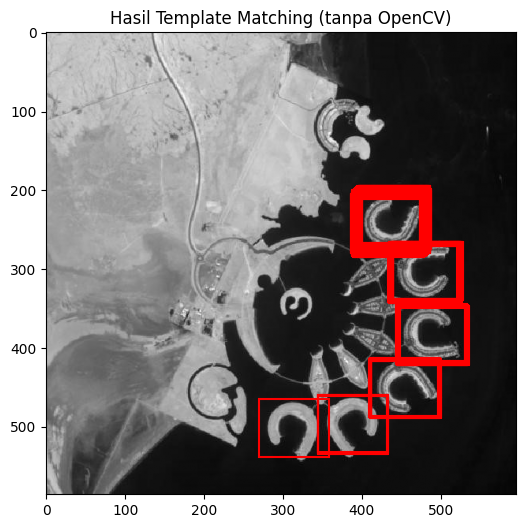

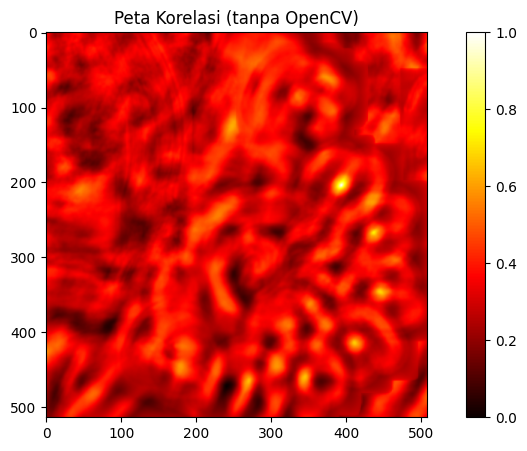

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

img_path = '/content/drive/MyDrive/pcvk/jb 11/bahrain.jpg'
templ_path = '/content/drive/MyDrive/pcvk/jb 11/bahrain-template.jpg'

image = color.rgb2gray(io.imread(img_path))
template = color.rgb2gray(io.imread(templ_path))

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Citra Asli (bahrain.jpg)')
ax[0].axis('off')

ax[1].imshow(template, cmap='gray')
ax[1].set_title('Citra Template (bahrain-template.jpg)')
ax[1].axis('off')

plt.show()

th, tw = template.shape

#Normalisasi template
template = (template - np.mean(template)) / (np.std(template) + 1e-9)

#Cross-correlation manual
corr = np.zeros((image.shape[0] - th + 1, image.shape[1] - tw + 1))
for y in range(corr.shape[0]):
    for x in range(corr.shape[1]):
        patch = image[y:y+th, x:x+tw]
        patch = (patch - np.mean(patch)) / (np.std(patch) + 1e-9)
        corr[y, x] = np.sum(patch * template)

# Normalisasi hasil
corr = (corr - np.min(corr)) / (np.max(corr) - np.min(corr))

#Threshold(untuk sensivitas deteksi)
threshold = 0.65
y_coords, x_coords = np.where(corr >= threshold)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image, cmap='gray')
ax.set_title('Hasil Template Matching (tanpa OpenCV)')
for (x, y) in zip(x_coords, y_coords):
    rect = plt.Rectangle((x, y), tw, th, edgecolor='r', facecolor='none', linewidth=1.5)
    ax.add_patch(rect)
plt.show()

plt.figure(figsize=(10,5))
plt.imshow(corr, cmap='hot')
plt.title('Peta Korelasi (tanpa OpenCV)')
plt.colorbar()
plt.show()


# metode Sobel Edge Detection, Canny EdgeDetection, dan Laplacian Edge Detection

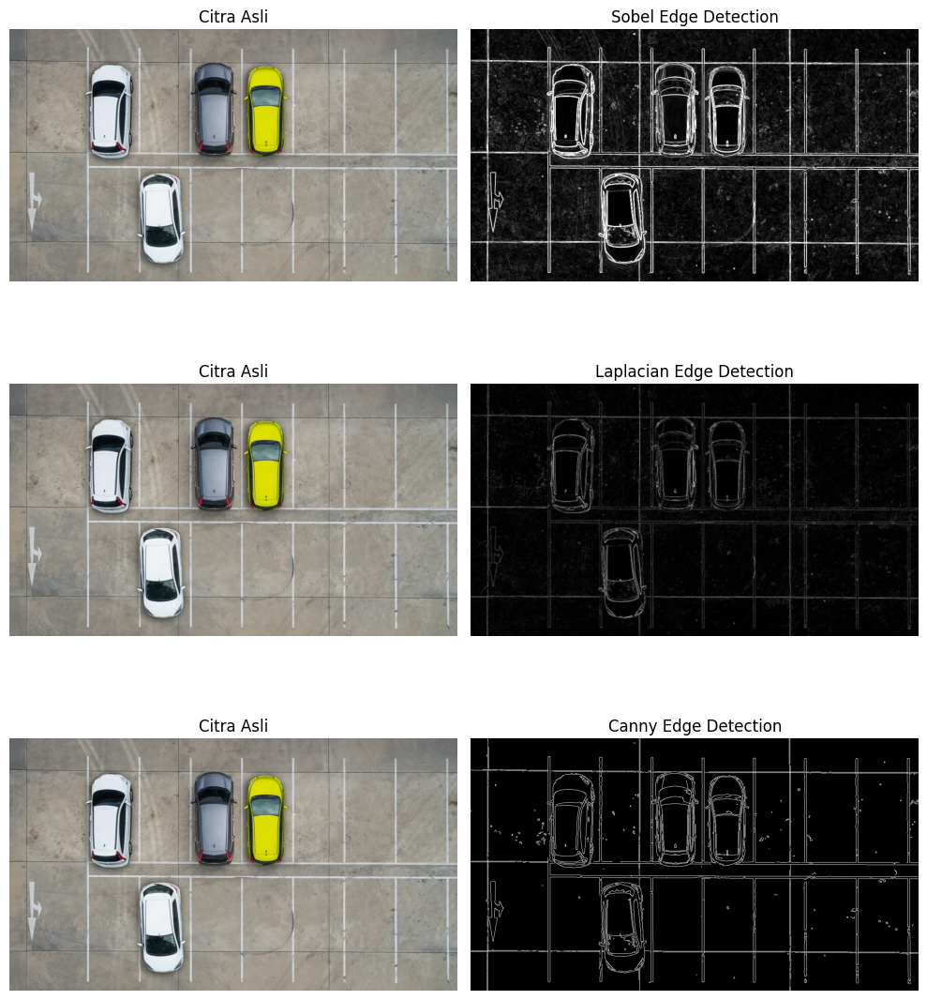

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

img_path = '/content/drive/MyDrive/pcvk/jb 11/car-park.jpg'

img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#Sobel Edge Detection
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=3)
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=3)
sobel_combined = cv.magnitude(sobelx, sobely)
sobel_combined = cv.convertScaleAbs(sobel_combined)

#Laplacian Edge Detection
laplacian = cv.Laplacian(gray, cv.CV_64F)
laplacian = cv.convertScaleAbs(laplacian)

#Canny Edge Detection
canny = cv.Canny(gray, 100, 200)

results = [
    ('Citra Asli', cv.cvtColor(img, cv.COLOR_BGR2RGB), 'Sobel Edge Detection', sobel_combined),
    ('Citra Asli', cv.cvtColor(img, cv.COLOR_BGR2RGB), 'Laplacian Edge Detection', laplacian),
    ('Citra Asli', cv.cvtColor(img, cv.COLOR_BGR2RGB), 'Canny Edge Detection', canny)
]

#hasil
plt.figure(figsize=(10, 12))
for i, (title1, img1, title2, img2) in enumerate(results):
    plt.subplot(3, 2, 2*i + 1)
    plt.imshow(img1)
    plt.title(title1)
    plt.axis('off')

    plt.subplot(3, 2, 2*i + 2)
    plt.imshow(img2, cmap='gray')
    plt.title(title2)
    plt.axis('off')

plt.tight_layout()
plt.show()


# Metode sobel edge detection

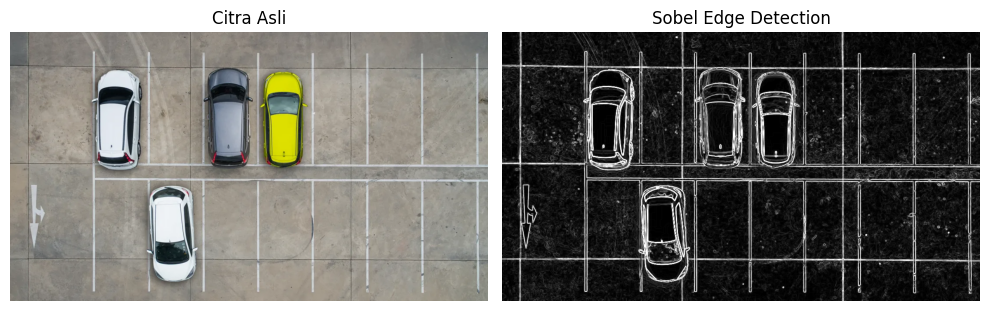

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

# === Path gambar ===
img_path = '/content/drive/MyDrive/pcvk/jb 11/car-park.jpg'

# === Baca gambar dan ubah ke grayscale ===
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# === Sobel Edge Detection ===
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=3)
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=3)
sobel_combined = cv.magnitude(sobelx, sobely)
sobel_combined = cv.convertScaleAbs(sobel_combined)

# === Tampilkan hasil ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()


# laplacian edge detection

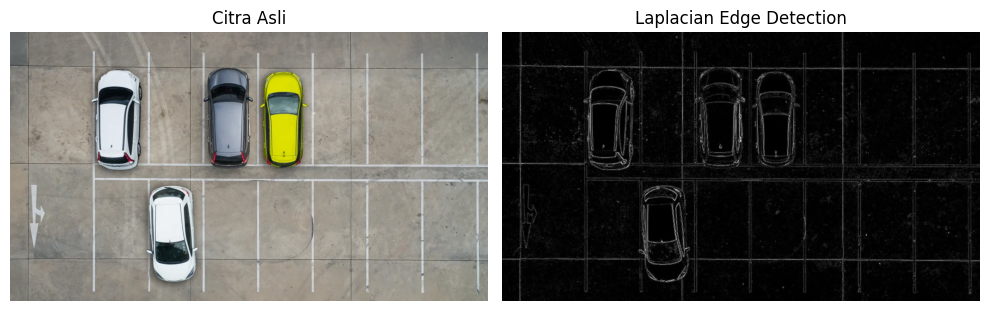

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

# === Path gambar ===
img_path = '/content/drive/MyDrive/pcvk/jb 11/car-park.jpg'

# === Baca gambar dan ubah ke grayscale ===
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# === Laplacian Edge Detection ===
laplacian = cv.Laplacian(gray, cv.CV_64F)
laplacian = cv.convertScaleAbs(laplacian)

# === Tampilkan hasil ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()


# canny edge detection

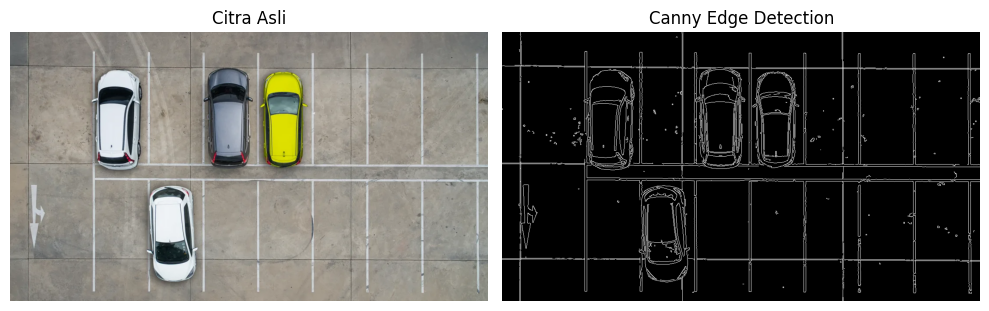

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

# === Path gambar ===
img_path = '/content/drive/MyDrive/pcvk/jb 11/car-park.jpg'

# === Baca gambar dan ubah ke grayscale ===
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# === Canny Edge Detection ===
canny = cv.Canny(gray, 100, 200)

# === Tampilkan hasil ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()


# Harris Corner Detection

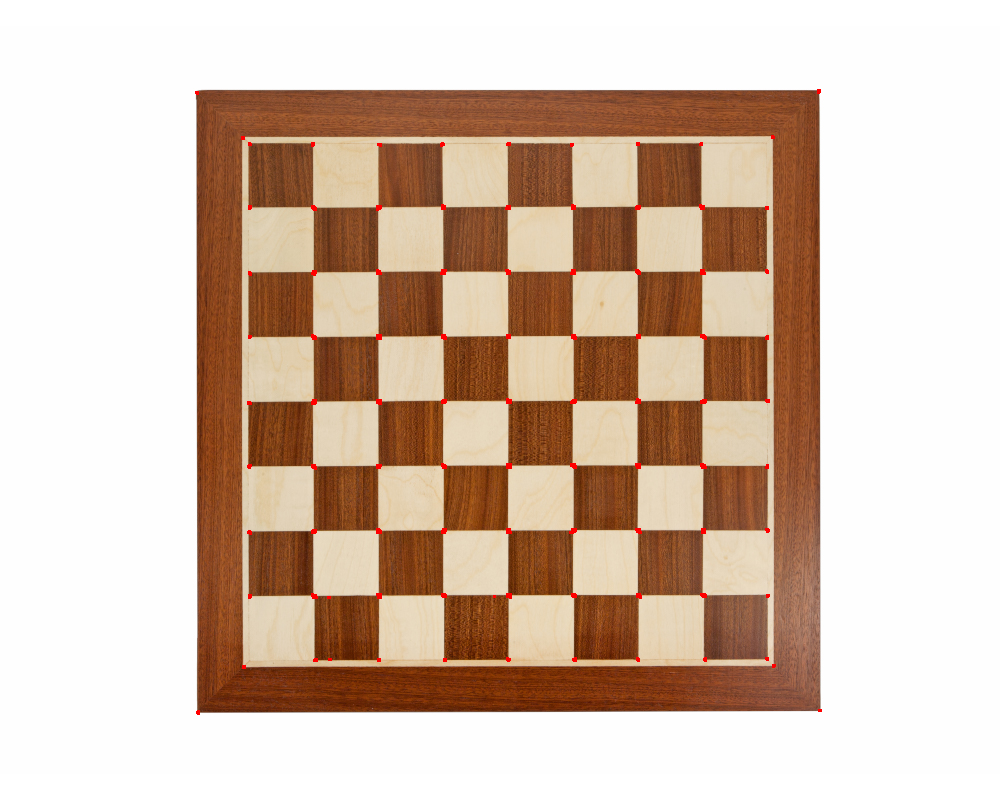

In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

filename = '/content/drive/MyDrive/pcvk/jb 11/chess-board.jpg'

img = cv.imread(filename)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray = np.float32(gray)

# Deteksi sudut dengan Harris Corner
dst = cv.cornerHarris(gray, 2, 3, 0.04)

# Dilatasi untuk memperjelas hasil deteksi
dst = cv.dilate(dst, None)

# tandai dengan warna merah
img[dst > 0.01 * dst.max()] = [0, 0, 255]

cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()


# Shi-Tomasi Corner Detection

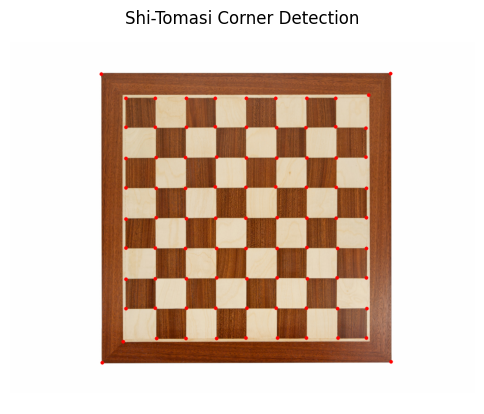

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('/content/drive/MyDrive/pcvk/jb 11/chess-board.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#Deteksi sudut dengan Shi-Tomasi
corners = cv.goodFeaturesToTrack(gray, 85, 0.01, 10)
corners = corners.astype(int)

#Gambar titik sudut pada citra asli
for i in corners:
    x, y = i.ravel()
    cv.circle(img, (x, y), 4, (0, 0, 255), -1)

plt.figure(figsize=(6,6))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Corner Detection')
plt.axis('off')
plt.show()


# Hough Transform

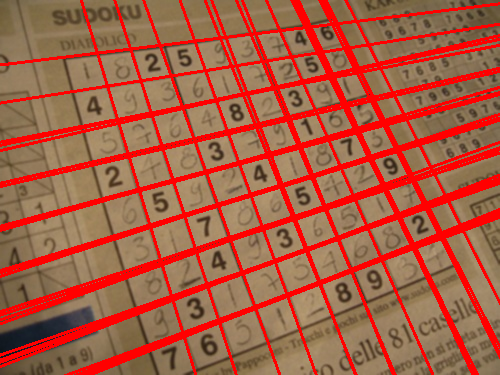

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/pcvk/jb 11/sudoku.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Deteksi tepi
edges = cv2.Canny(gray, 50, 150, apertureSize=3)

# Deteksi garis dengan Hough Transform
lines = cv2.HoughLines(edges, 1, np.pi/180, 160)

# Gambar garis hasil deteksi
if lines is not None:
    for line in lines:
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

cv2_imshow(img)


# fungsi findContours()

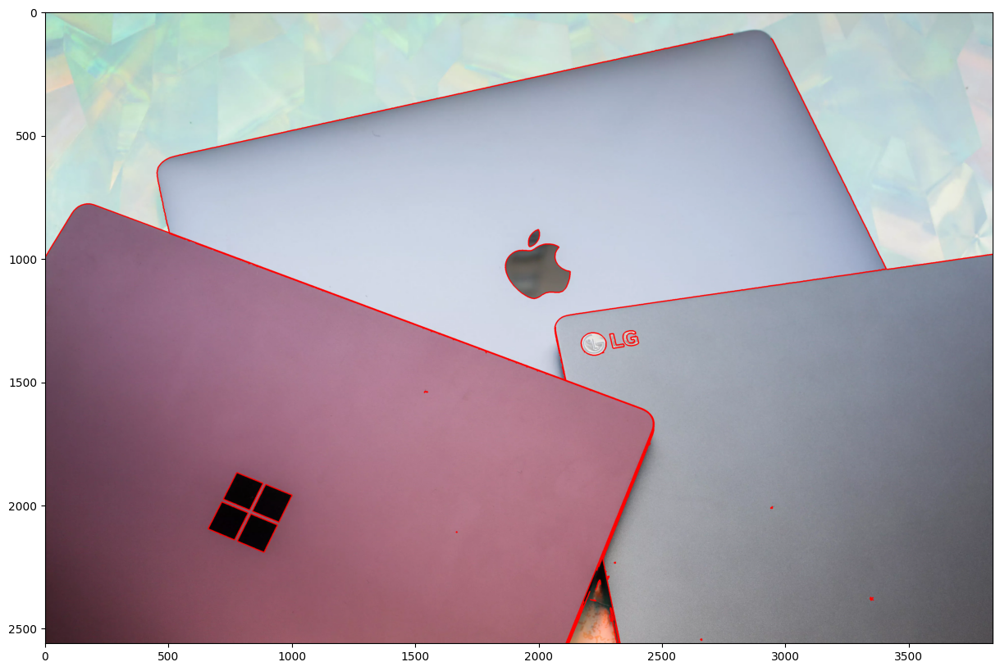

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

#Countour Detection
img = cv.imread('/content/drive/MyDrive/pcvk/jb 11/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))


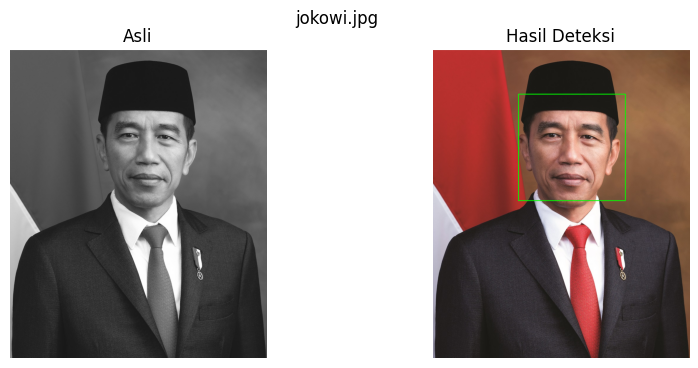

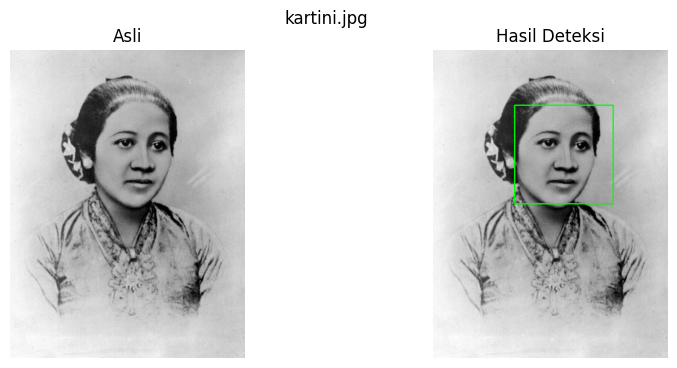

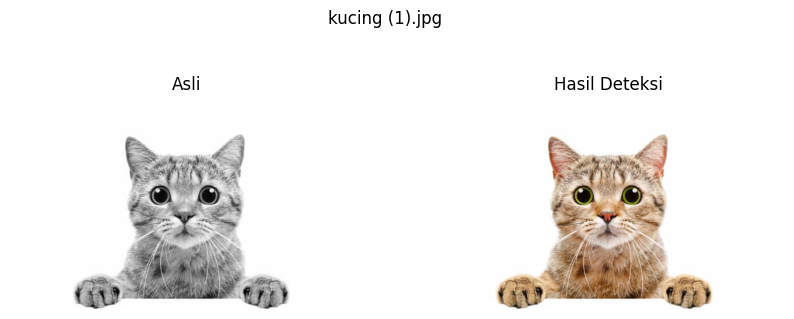

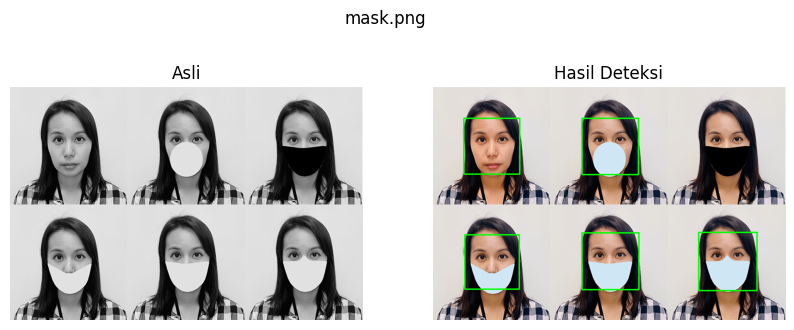

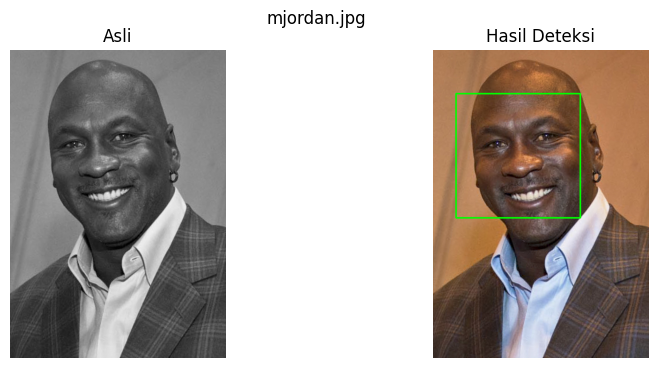

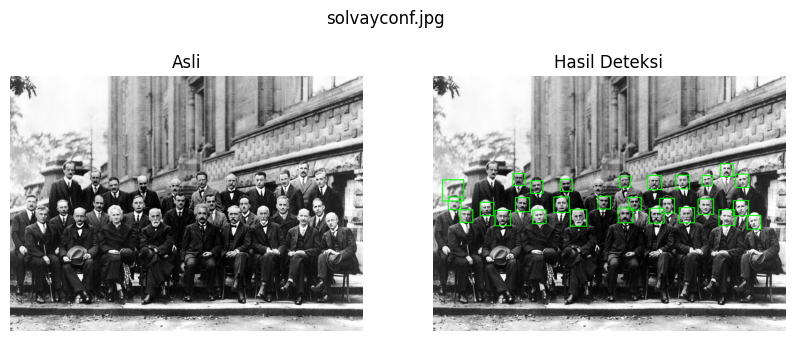

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load cascade
face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/pcvk/jb 11/haarcascades/haarcascade_frontalface_alt.xml')

images = [
    'jokowi.jpg',
    'kartini.jpg',
    'kucing (1).jpg',
    'mask.png',
    'mjordan.jpg',
    'solvayconf.jpg'
]

for name in images:
    path = f'/content/drive/MyDrive/pcvk/jb 11/facedetection/{name}'

    # Baca gambar berwarna dan grayscale
    img_color = cv2.imread(path)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

    # Deteksi wajah
    faces = face_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=4)

    # Gambar kotak hijau
    for (x, y, w, h) in faces:
        cv2.rectangle(img_color, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB))
    plt.title('Asli')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
    plt.title('Hasil Deteksi')
    plt.axis('off')

    plt.suptitle(name)
    plt.show()


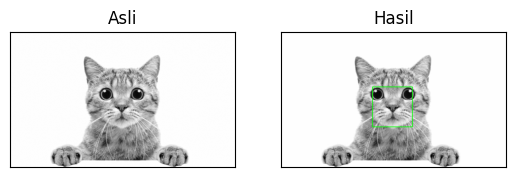

In [ ]:
import cv2
from matplotlib import pyplot as plt

mycat = cv2.imread('/content/drive/MyDrive/pcvk/jb 11/facedetection/kucing (1).jpg', 0)

path_xml = '/content/drive/MyDrive/pcvk/jb 11/facedetection/haarcascade_frontalcatface.xml'
cat_face_cascade = cv2.CascadeClassifier(path_xml)

# Deteksi wajah kucin
cat_faces = cat_face_cascade.detectMultiScale(mycat)

cat_faces = cat_face_cascade.detectMultiScale(
    mycat,
    scaleFactor=1.05,
    minNeighbors=10,
    minSize=(75, 75)

mycatw = cv2.cvtColor(mycat, cv2.COLOR_GRAY2RGB)

# gambar kotak hijau
for (x, y, w, h) in cat_faces:
    cv2.rectangle(mycatw, (x, y), (x+w, y+h), (0, 255, 0), 2)

plt.subplot(121)
plt.imshow(mycat, cmap='gray')
plt.title('Asli')
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.imshow(mycatw)
plt.title('Hasil')
plt.xticks([]), plt.yticks([])

plt.show()


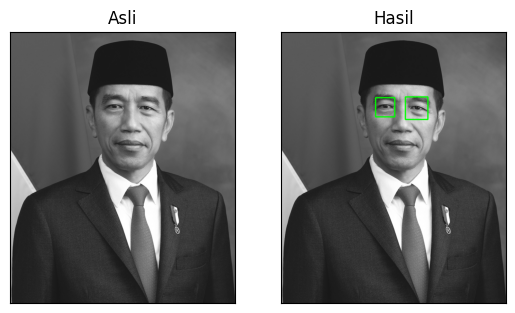

In [ ]:
import cv2
from matplotlib import pyplot as plt

# Load cascade mata
cascade_mata = cv2.CascadeClassifier('/content/drive/MyDrive/pcvk/jb 11/facedetection/haarcascade_eye.xml')
if cascade_mata.empty():
    print("Gagal memuat cascade mata!")

jokowi_gray = cv2.imread('/content/drive/MyDrive/pcvk/jb 11/facedetection/jokowi.jpg', 0)

# Deteksi mata
roi_wajah = cascade_mata.detectMultiScale(jokowi_gray, scaleFactor=1.1, minNeighbors=5)

jokowiw = cv2.cvtColor(jokowi_gray, cv2.COLOR_GRAY2RGB)

# Gambar kotak hijau
for (x, y, w, h) in roi_wajah:
    cv2.rectangle(jokowiw, (x, y), (x+w, y+h), (0, 255, 0), 3)

plt.subplot(121)
plt.imshow(jokowi_gray, cmap='gray')
plt.title('Asli')
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.imshow(jokowiw)
plt.title('Hasil')
plt.xticks([]), plt.yticks([])

plt.show()


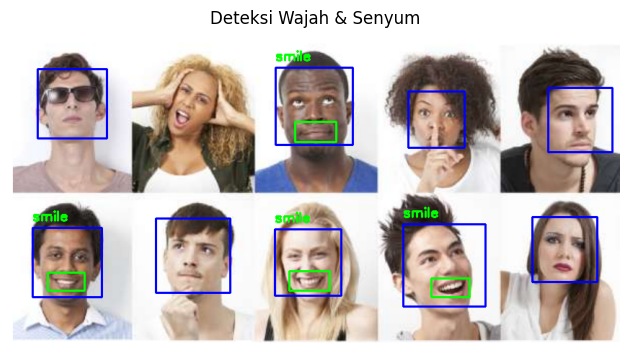

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

# Load model Haar Cascade
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')
smile_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_smile.xml')

img = cv.imread('/content/drive/MyDrive/pcvk/jb 11/smile.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah
# faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(80, 80))
faces = face_cascade.detectMultiScale(gray)

# Salin gambar
result = img.copy()

# deteksi senyumnya
for (x, y, w, h) in faces:
    # Gambar kotak
    cv.rectangle(result, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Ambil ROI wajah
    roi_gray = gray[y:y + h, x:x + w]
    roi_color = result[y:y + h, x:x + w]

    # Deteksi senyum di area wajah
    smiles = smile_cascade.detectMultiScale(
        roi_gray,
        scaleFactor=1.3,
        minNeighbors=8,
    )

    # Gambar kotak di area senyum
    for (sx, sy, sw, sh) in smiles:
        cv.rectangle(roi_gray, (sx, sy), (sx + sw, sy + sh), (0, 255, 0), 2)

    if len(smiles) > 0:
        cv.putText(result, "smile", (x, y - 10),
                   cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        for (sx, sy, sw, sh) in smiles:
          cv.rectangle(roi_color, (sx, sy), (sx + sw, sy + sh), (0, 255, 0), 2)

result_rgb = cv.cvtColor(result, cv.COLOR_BGR2RGB)
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.imshow(img_rgb)
# plt.title("Citra Asli (People)")
# plt.axis('off')

# plt.subplot(1, 2, 2)
plt.imshow(result_rgb)
plt.title("Deteksi Wajah & Senyum")
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

In [ ]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [ ]:
# initialize the Haar Cascade face detection model
face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))

In [ ]:
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data)
  # grayscale img
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  print(gray.shape)
  # get face bounding box coordinates using Haar Cascade
  faces = face_cascade.detectMultiScale(gray)
  # draw face bounding box on image
  for (x,y,w,h) in faces:
      img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

(480, 640)
Saved to photo.jpg


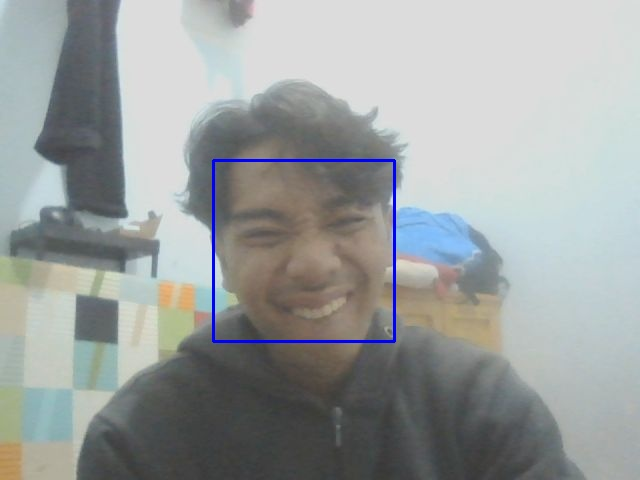

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "Status:";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '' +
          'When finished, click here or on the video to stop this demo';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    img = js_to_image(js_reply["img"])

    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # grayscale image for face detection
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # get face region coordinates
    faces = face_cascade.detectMultiScale(gray)
    # get face bounding box for overlay
    for (x,y,w,h) in faces:
      bbox_array = cv2.rectangle(bbox_array,(x,y),(x+w,y+h),(255,0,0),2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes

TypeError: 'numpy.ndarray' object is not callable

Error: 'NoneType' object has no attribute 'split'


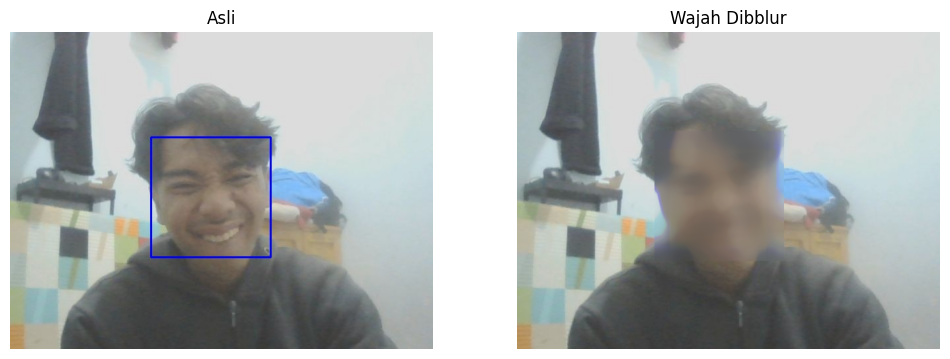

In [ ]:
from IPython.display import display, Image
from google.colab import output
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from base64 import b64decode

# --- Fungsi ambil foto dari webcam ---
def take_photo(filename='photo.jpg', quality=0.8):
  js = """
  async function takePhoto(quality) {
    const div = document.createElement('div');
    const capture = document.createElement('button');
    capture.textContent = '📸 Ambil Foto';
    div.appendChild(capture);
    const video = document.createElement('video');
    video.style.display = 'block';
    const stream = await navigator.mediaDevices.getUserMedia({video: true});
    document.body.appendChild(div);
    div.appendChild(video);
    video.srcObject = stream;
    await video.play();

    // Tunggu sampai tombol diklik
    await new Promise((resolve) => capture.onclick = resolve);

    const canvas = document.createElement('canvas');
    canvas.width = video.videoWidth;
    canvas.height = video.videoHeight;
    canvas.getContext('2d').drawImage(video, 0, 0);
    stream.getTracks().forEach(t => t.stop());
    div.remove();

    return canvas.toDataURL('image/jpeg', quality);
  }
  """
  data = output.eval_js(js)
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename


# --- Ambil foto dari webcam ---
try:
  filename = take_photo('photo.jpg')
  print('Foto berhasil disimpan ke:', filename)
  display(Image(filename))
except Exception as err:
  print('Error:', err)


img = cv.imread('photo.jpg')

if img is not None:
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

  # Load model deteksi wajah
  face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

  # Deteksi wajah
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)

  # Blur hanya di area wajah
  for (x, y, w, h) in faces:
      roi = img[y:y+h, x:x+w]
      blurred_face = cv.medianBlur(roi, 35)
      img[y:y+h, x:x+w] = blurred_face

  plt.figure(figsize=(12,6))
  plt.subplot(1,2,1)
  plt.imshow(cv.cvtColor(cv.imread('photo.jpg'), cv.COLOR_BGR2RGB))
  plt.title("Asli")
  plt.axis('off')

  plt.subplot(1,2,2)
  plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
  plt.title("Wajah Dibblur")
  plt.axis('off')

  plt.show()

else:
  print("Gagal membaca foto. Pastikan kamera diizinkan dan foto tersimpan.")


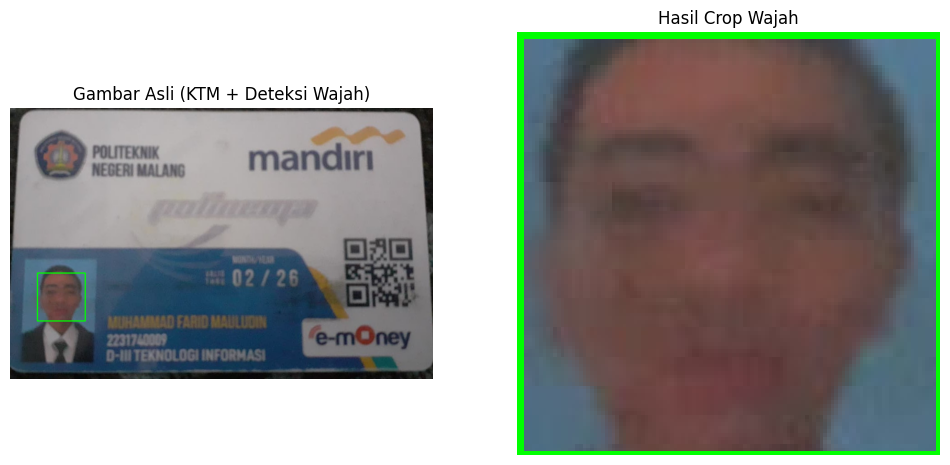

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

img_path = '/content/drive/MyDrive/pcvk/jb 11/facedetection/ktm.jpg'
img = cv.imread(img_path)

if img is None:
    print("Gambar tidak ditemukan! Cek kembali path file.")
else:
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Load Haar Cascade untuk wajah
    face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

    # Deteksi wajah
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    if len(faces) == 0:
        print("Tidak ada wajah terdeteksi.")
    else:
        for (x, y, w, h) in faces:
            face_crop = img[y:y+h, x:x+w]
            cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        face_rgb = cv.cvtColor(face_crop, cv.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(img_rgb)
        plt.title("Gambar Asli (KTM + Deteksi Wajah)")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(face_rgb)
        plt.title("Hasil Crop Wajah")
        plt.axis('off')

        plt.show()


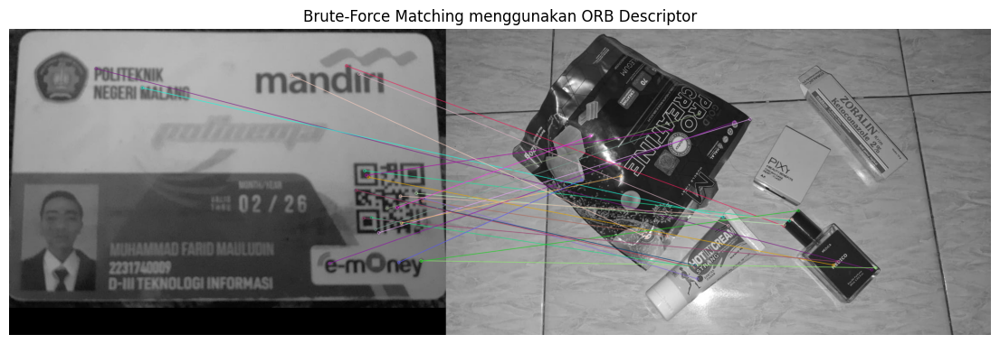

In [ ]:
img_object = cv.imread('/content/drive/MyDrive/pcvk/jb 11/facedetection/ktm.jpg', cv.IMREAD_GRAYSCALE)
img_scene = cv.imread('/content/drive/MyDrive/pcvk/jb 11/facedetection/ieron.jpg', cv.IMREAD_GRAYSCALE)

# Inisialisasi ORB
orb = cv.ORB_create()

# Temukan keypoints dan descriptor
kp1, des1 = orb.detectAndCompute(img_object, None)
kp2, des2 = orb.detectAndCompute(img_scene, None)

# Matcher
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

result = cv.drawMatches(img_object, kp1, img_scene, kp2, matches[:25], None, flags=2)
plt.figure(figsize=(14,7))
plt.title('Brute-Force Matching menggunakan ORB Descriptor')
plt.imshow(result)
plt.axis('off')
plt.show()


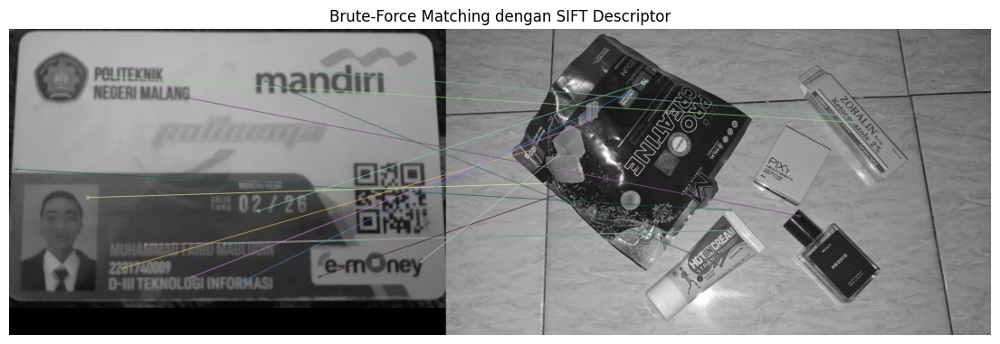

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

img_object = cv.imread('/content/drive/MyDrive/pcvk/jb 11/facedetection/ktm.jpg', cv.IMREAD_GRAYSCALE)
img_scene = cv.imread('/content/drive/MyDrive/pcvk/jb 11/facedetection/ieron.jpg', cv.IMREAD_GRAYSCALE)

# 2) Inisialisasi SIFT
sift = cv.SIFT_create()

# 3) Deteksi keypoints & descriptor
kp1, des1 = sift.detectAndCompute(img_object, None)
kp2, des2 = sift.detectAndCompute(img_scene, None)

# 4) Matching (Brute-Force + KNN)
bf = cv.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# 5) Ratio test (Lowe’s ratio = 0.75)
good = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good.append([m])

result = cv.drawMatchesKnn(img_object, kp1, img_scene, kp2, good, None, flags=2)
plt.figure(figsize=(14,7))
plt.title('Brute-Force Matching dengan SIFT Descriptor')
plt.imshow(result)
plt.axis('off')
plt.show()

In [ ]:
import os
import tqdm
import cv2
import random
import numpy as np
import pickle

DATADIR = "/content/drive/MyDrive/pcvk/dataset"
dirs = []
training_data = []
width, height = 100, 100

# Ambil semua nama folder
for char_name in sorted(os.listdir(DATADIR)):
    dirs.append(char_name)

# Ubah semua gambar menjadi array
for char_name in dirs:
    path = os.path.join(DATADIR, char_name)
    class_number = dirs.index(char_name)

    for img in tqdm.tqdm(os.listdir(path)):
        try:
            img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
            new_array = cv2.resize(img_array, (width, height))
            training_data.append([new_array, class_number])
        except Exception as e:
            pass

random.shuffle(training_data)

X, Y = [], []
for feature, label in training_data:
    X.append(feature)
    Y.append(label)

X = np.array(X).reshape(-1, width, height, 1)

# Simpan data
with open("X.pickle", "wb") as pickle_out:
    pickle.dump(X, pickle_out)

with open("Y.pickle", "wb") as pickle_out:
    pickle.dump(Y, pickle_out)


100%|██████████| 200/200 [00:01<00:00, 172.23it/s]


In [1]:
import pickle
import numpy as np
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, ZeroPadding2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

X = pickle.load(open("/content/X.pickle", "rb"))
Y = pickle.load(open("/content/Y.pickle", "rb"))

# Preprocessing
Y = to_categorical(Y)   # ubah label ke one-hot encoding
X = X / 255.0           # normalisasi pixel ke 0-1

width, height = 100, 100
num_classes = Y.shape[1]  # otomatis deteksi jumlah kelas

# Split data untuk training dan testing
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Arsitektur CNN
inputs = Input(shape=(width, height, 1))

conv_layer = ZeroPadding2D(padding=(2, 2))(inputs)
conv_layer = Conv2D(16, (5, 5), activation='relu')(conv_layer)
conv_layer = MaxPooling2D((2, 2))(conv_layer)

conv_layer = Conv2D(32, (3, 3), activation='relu')(conv_layer)
conv_layer = Conv2D(32, (3, 3), activation='relu')(conv_layer)
conv_layer = MaxPooling2D((2, 2))(conv_layer)

conv_layer = Conv2D(64, (3, 3), activation='relu')(conv_layer)
flatten = Flatten()(conv_layer)

fc_layer = Dense(256, activation='relu')(flatten)
fc_layer = Dense(64, activation='relu')(fc_layer)
outputs = Dense(num_classes, activation='softmax')(fc_layer)

# Kompilasi Model
adam = Adam(learning_rate=0.0001)
model = Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Training
print("🚀 Training model dimulai...\n")
model.fit(X_train, Y_train, epochs=20, validation_data=(X_test, Y_test), verbose=1)

save_path = "/content/drive/MyDrive/pcvk/anpr.h5"
model.save(save_path)

print(f"\n✅ Model CNN selesai dilatih dan disimpan di: {save_path}")


🚀 Training model dimulai...

Epoch 1/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 28s 505ms/step - accuracy: 0.1530 - loss: 2.2735 - val_accuracy: 0.3050 - val_loss: 2.0084
Epoch 2/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 41s 508ms/step - accuracy: 0.4733 - loss: 1.7147 - val_accuracy: 0.6200 - val_loss: 1.2709
Epoch 3/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 41s 507ms/step - accuracy: 0.6882 - loss: 1.0095 - val_accuracy: 0.7675 - val_loss: 0.8036
Epoch 4/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 41s 501ms/step - accuracy: 0.8094 - loss: 0.6441 - val_accuracy: 0.8475 - val_loss: 0.5324
Epoch 5/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 41s 501ms/step - accuracy: 0.8782 - loss: 0.4014 - val_accuracy: 0.8525 - val_loss: 0.4877
Epoch 6/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 24s 476ms/step - accuracy: 0.9102 - loss: 0.2878 - val_accuracy: 0.8975 - val_loss: 0.3441
Epoch 7/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 42s 504ms/step - accuracy: 0.9249 - loss: 0.2569 - val_accuracy: 0.8950 - val_loss: 0.3579
Epoch 8/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 41s 502ms/step - accuracy: 0.9


✅ Model CNN selesai dilatih dan disimpan di: /content/drive/MyDrive/pcvk/anpr.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
🪪 NIM TERDETEKSI: 2302035304


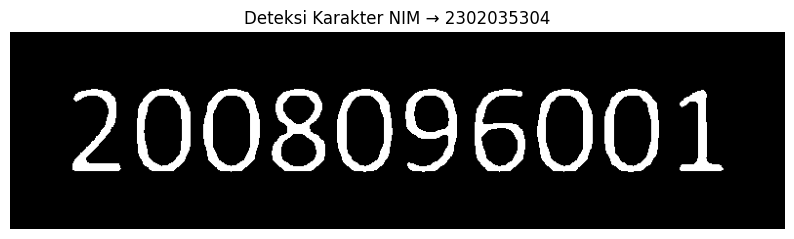

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf

# --- Konfigurasi path ---
ktm_path = '/content/drive/MyDrive/pcvk/jb 11/Cuplikan layar 2025-11-13 224351.png'   # ubah sesuai lokasi KTM
model_path = '/content/drive/MyDrive/pcvk/anpr.h5'  # model hasil training
crop_dir = '/content/drive/MyDrive/pcvk/ktm_chars'     # folder sementara hasil crop

os.makedirs(crop_dir, exist_ok=True)

# --- 1. Load dan pra-proses gambar KTM ---
img = cv2.imread(ktm_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)

# --- 2. Deteksi kontur karakter ---
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

chars = []
for i, cnt in enumerate(sorted(contours, key=lambda c: cv2.boundingRect(c)[0])):  # urutkan dari kiri ke kanan
    x, y, w, h = cv2.boundingRect(cnt)
    if h > 30 and w > 10:  # filter noise kecil
        char_img = gray[y:y+h, x:x+w]
        char_img = cv2.resize(char_img, (100, 100))
        cv2.imwrite(f'{crop_dir}/{i}.png', char_img)
        chars.append((x, char_img))  # simpan x untuk urutan nanti

# --- 3. Load model CNN ---
model = tf.keras.models.load_model(model_path)
dirs = [str(i) for i in range(10)]  # label angka 0–9

# --- 4. Prediksi tiap karakter ---
width, height = 100, 100
nim_prediksi = ""

for _, img_crop in sorted(chars, key=lambda c: c[0]):  # urut berdasarkan posisi x
    img_array = np.array(img_crop).reshape(-1, width, height, 1) / 255.0
    pred = model.predict(img_array)
    nim_prediksi += dirs[np.argmax(pred)]

# --- 5. Tampilkan hasil ---
print("🪪 NIM TERDETEKSI:", nim_prediksi)

# (Opsional) tampilkan hasil segmentasi
plt.figure(figsize=(10, 5))
plt.imshow(thresh, cmap='gray')
plt.title(f"Deteksi Karakter NIM → {nim_prediksi}")
plt.axis('off')
plt.show()


In [ ]:
!ls /content/*.pickle


/content/X.pickle  /content/Y.pickle
